<a href="https://colab.research.google.com/github/chielgroen1998/yourquant/blob/main/tutorial_udemy_notebook1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

importing in DATA


--- Fetching Full Portfolio Data (using yfinance) ---
Fetching BTC-USD (full history)...
Successfully fetched 4011 records for BTC-USD
Fetching QQQ (full history)...
Successfully fetched 3441 records for QQQ
Fetching GLD (full history)...
Successfully fetched 3441 records for GLD
Fetching GOAT (full history)...
Successfully fetched 1400 records for GOAT
Fetching SOL-USD (full history)...
Successfully fetched 1979 records for SOL-USD

✅ All available data fetched and combined successfully!
Combined data shape: (14272, 6)
Tickers in combined data: ['BTC-USD', 'QQQ', 'GLD', 'GOAT', 'SOL-USD']
Data covers: 2012-01-03 to 2025-09-09

--- Analysis and Statistics ---

--- Stats for BTC-USD ---
Yearly Data Points:
Date
2014    106
2015    365
2016    366
2017    365
2018    365
2019    365
2020    366
2021    365
2022    365
2023    365
2024    366
2025    252
Max Drawdown: -83.40%
Simple PnL (Start to End): 111235.16
CAGR: 65.00%

--- Stats for QQQ ---
Yearly Data Points:
Date
2012    250
201

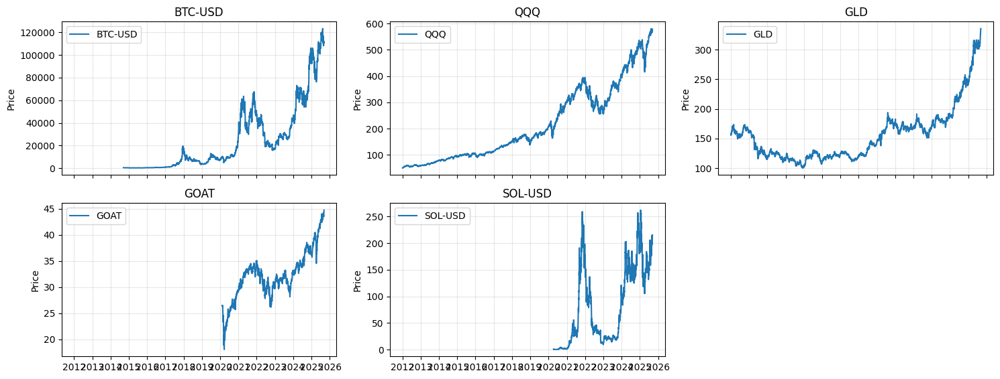


--- Data Fetching, Analysis, and Plotting Complete ---


In [21]:
import pandas as pd
import yfinance as yf # Import yfinance
import time
import matplotlib.pyplot as plt
import matplotlib.dates as mdates


# -------------------------------------------------------------
# Portfolio Configuration
# -------------------------------------------------------------
START_YEAR = 2012             # Filter data from this year onwards

TICKERS = [
    # Added based on user request
    "BTC-USD", # BTC for BTC Maxis
    "QQQ", # QQQ for when america goes great again
    "GLD", # GOLD for when BTC and FIAT fail
    "GOAT", # GOAT global all moat for possible boomer buffet victory all hail the old people
    "SOL-USD" # Solana for LEET altcoin season
]

# -------------------------------------------------------------
# Data Fetching Function using yfinance
# -------------------------------------------------------------
def fetch_yfinance_data(ticker: str, start_year: int) -> pd.DataFrame | None:
    """
    Fetch daily OHLCV data from yfinance for a single ticker.
    """
    try:
        # yfinance automatically handles mapping for common tickers like BTC-USD, SOL-USD
        ticker_data = yf.Ticker(ticker)
        df = ticker_data.history(period="max") # Fetch all available history

        if df.empty:
            print(f"⚠️ Warning: No data fetched for {ticker} from yfinance.")
            return None

        # Filter from START_YEAR
        df = df[df.index.year >= start_year]

        # yfinance provides standard column names (Open, High, Low, Close, Volume)
        # Ensure 'Close' column exists
        if 'Close' not in df.columns:
             print(f"⚠️ Warning: 'Close' column not found for {ticker} in yfinance data.")
             return None

        df["Ticker"] = ticker
        return df[["Open", "High", "Low", "Close", "Volume", "Ticker"]].copy() # Select and order columns

    except Exception as e:
        print(f"Error fetching data for {ticker} with yfinance: {e}")
        return None

# -------------------------------------------------------------
# Main Data Fetching and Plotting Workflow
# -------------------------------------------------------------
print("\n--- Fetching Full Portfolio Data (using yfinance) ---")
all_data = []

for ticker in TICKERS:
    print(f"Fetching {ticker} (full history)...")
    # Using the yfinance fetcher
    df = fetch_yfinance_data(ticker, START_YEAR)
    if df is not None:
        all_data.append(df)
        print(f"Successfully fetched {len(df)} records for {ticker}")
    time.sleep(1) # Small delay to be polite, yfinance doesn't have strict API limits like Alpha Vantage

if not all_data:
    raise RuntimeError("No data was fetched for any ticker from yfinance. Please check ticker symbols or internet connection.")

data = pd.concat(all_data)
print("\n✅ All available data fetched and combined successfully!")
print(f"Combined data shape: {data.shape}")
print(f"Tickers in combined data: {data['Ticker'].unique().tolist()}")
print(f"Data covers: {data.index.min().date()} to {data.index.max().date()}")


# -------------------------------------------------------------
# Analysis and Printing Stats
# -------------------------------------------------------------
print("\n--- Analysis and Statistics ---")

for ticker in data['Ticker'].unique():
    ticker_data = data[data['Ticker'] == ticker].copy()

    if not ticker_data.empty and 'Close' in ticker_data.columns:
        print(f"\n--- Stats for {ticker} ---")

        # Ensure the index is a DatetimeIndex before accessing year
        ticker_data.index = pd.to_datetime(ticker_data.index)

        # Year Counts
        year_counts = ticker_data.index.year.value_counts().sort_index()
        print("Yearly Data Points:")
        print(year_counts.to_string())

        # Max Drawdown
        # Calculate daily returns
        returns = ticker_data['Close'].pct_change()
        # Calculate cumulative returns
        cumulative_returns = (1 + returns).cumprod()
        # Calculate peak values
        peak = cumulative_returns.expanding(min_periods=1).max()
        # Calculate drawdown
        drawdown = (cumulative_returns / peak) - 1
        # Calculate max drawdown
        max_drawdown = drawdown.min()
        print(f"Max Drawdown: {max_drawdown:.2%}")

        # PnL (assuming simple buy and hold)
        start_price = ticker_data['Close'].iloc[0]
        end_price = ticker_data['Close'].iloc[-1]
        pnl = end_price - start_price
        print(f"Simple PnL (Start to End): {pnl:.2f}")

        # CAGR (Compound Annual Growth Rate)
        start_date = ticker_data.index.min()
        end_date = ticker_data.index.max()
        # Calculate number of years
        # Add a small epsilon to avoid division by zero for very short periods
        num_years = (end_date - start_date).days / 365.25 if (end_date - start_date).days > 0 else 1e-6
        if start_price > 0: # Avoid division by zero
             cagr = ((end_price / start_price)**(1 / num_years)) - 1
             print(f"CAGR: {cagr:.2%}")
        else:
             print("CAGR: Cannot calculate (start price is zero or negative)")


    else:
        print(f"\n--- No data or 'Close' column for {ticker}, skipping stats ---")


# -------------------------------------------------------------
# Plotting - Individual Ticker Performance (small multiples)
# -------------------------------------------------------------
print("\n--- Plotting Individual Ticker Performance ---")
tickers_to_plot = data['Ticker'].unique()
n_plots = len(tickers_to_plot)
# Determine grid size for subplots
n_cols = 3 # You can adjust this for wider or narrower grids
n_rows = (n_plots + n_cols - 1) // n_cols

fig_multiples, axes_multiples = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 3 * n_rows), sharex=True)
axes_multiples = axes_multiples.flatten() # Flatten for easy iteration

for i, ticker in enumerate(tickers_to_plot):
    ax = axes_multiples[i]
    ticker_data = data[data['Ticker'] == ticker]

    # Ensure unique index by grouping on Date if duplicates exist (shouldn't if data is clean)
    if not ticker_data.index.is_unique:
        ticker_data = ticker_data.groupby(ticker_data.index).mean(numeric_only=True)

    # Plot closing price, ensuring 'Close' column exists
    if 'Close' in ticker_data.columns:
        ax.plot(ticker_data.index, ticker_data['Close'], label=ticker, linewidth=1.5)
    else:
        print(f"⚠️ Warning: 'Close' column not found for {ticker}. Skipping individual plot.")
        continue

    # Formatting
    ax.set_title(ticker)
    ax.set_ylabel('Price')
    ax.grid(True, alpha=0.3)
    ax.legend(loc='upper left')

# Set common X-axis locators/formatters only on the bottom row for clarity
for ax_row in axes_multiples.reshape(n_rows, n_cols)[-1]:
    ax_row.xaxis.set_major_locator(mdates.YearLocator())
    ax_row.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Hide any unused subplots
for j in range(i + 1, len(axes_multiples)):
    fig_multiples.delaxes(axes_multiples[j])

plt.tight_layout(rect=[0, 0, 1, 0.96]) # Adjust for suptitle
plt.show()

print("\n--- Data Fetching, Analysis, and Plotting Complete ---")

In [31]:
data

,Open,High,Low,Close,Volume,Ticker
Date,,,,,,
2014-09-17 00:00:00+00:00,465.864014,468.174011,452.421997,457.334015,21056800,BTC-USD
2014-09-18 00:00:00+00:00,456.859985,456.859985,413.104004,424.440002,34483200,BTC-USD
2014-09-19 00:00:00+00:00,424.102997,427.834991,384.532013,394.795990,37919700,BTC-USD
2014-09-20 00:00:00+00:00,394.673004,423.295990,389.882996,408.903992,36863600,BTC-USD
2014-09-21 00:00:00+00:00,408.084991,412.425995,393.181000,398.821014,26580100,BTC-USD
...,...,...,...,...,...,...
2025-09-05 00:00:00+00:00,202.546738,209.860062,201.180008,203.498520,7780086538,SOL-USD
2025-09-06 00:00:00+00:00,203.498520,204.557541,199.640396,200.246307,3057210360,SOL-USD
2025-09-07 00:00:00+00:00,200.247360,207.867340,200.228500,206.468185,4153166545,SOL-USD


In [22]:
# Sort the assets by their average absolute correlation
correlation_ranking = average_abs_correlation.sort_values()

print("Asset correlation ranking (lowest to highest average absolute correlation):")
display(correlation_ranking)

Asset correlation ranking (lowest to highest average absolute correlation):


,0
Ticker,
SOL-USD,3.867474
GLD,3.953993
GOAT,4.190246
BTC-USD,4.300096
QQQ,4.313581


In [30]:
# Select asset for analysis
selected_ticker = "BTC-USD" # You can change this to any ticker in your data

# Display the selected ticker's data with calculated indicators
display(selected_ticker_data)

,BTC-USD
Date,
2014-09-17 00:00:00+00:00,457.334015
2014-09-17 04:00:00+00:00,457.334015
2014-09-18 00:00:00+00:00,424.440002
2014-09-18 04:00:00+00:00,424.440002
2014-09-19 00:00:00+00:00,394.795990
...,...
2025-09-07 00:00:00+00:00,111167.617188
2025-09-08 00:00:00+00:00,112071.429688
2025-09-08 04:00:00+00:00,112071.429688


,BTC-USD
Date,
2014-09-17 00:00:00+00:00,457.334015
2014-09-17 04:00:00+00:00,457.334015
2014-09-18 00:00:00+00:00,424.440002
2014-09-18 04:00:00+00:00,424.440002
2014-09-19 00:00:00+00:00,394.795990
...,...
2025-09-07 00:00:00+00:00,111167.617188
2025-09-08 00:00:00+00:00,112071.429688
2025-09-08 04:00:00+00:00,112071.429688


In [42]:
import pandas as pd
import numpy as np

# Parameters
short_window = 50
long_window = 200
atr_window = 14
atr_multiplier = 2

# Calculate indicators
def calculate_indicators(data):
    # SMAs
    data[f'SMA_{short_window}'] = data['Close'].rolling(short_window).mean()
    data[f'SMA_{long_window}'] = data['Close'].rolling(long_window).mean()

    # ATR
    prev_close = data['Close'].shift(1)
    tr1 = data['High'] - data['Low']
    tr2 = abs(data['High'] - prev_close)
    tr3 = abs(data['Low'] - prev_close)
    tr = np.maximum(tr1, np.maximum(tr2, tr3))
    data['ATR'] = tr.rolling(atr_window).mean()

    # ATR Channels
    data['ATR_Upper'] = data['Close'] + (data['ATR'] * atr_multiplier)
    data['ATR_Lower'] = data['Close'] - (data['ATR'] * atr_multiplier)

    # VWAP
    # Ensure the index is a DatetimeIndex for potential future time-based calculations,
    # although VWAP itself is cumulative and doesn't strictly require it for this calculation
    if not isinstance(data.index, pd.DatetimeIndex):
         data.index = pd.to_datetime(data.index, utc=True)

    # Ensure 'Volume' is numeric and handle potential NaNs or inf values before cumulative sum
    data['Volume'] = pd.to_numeric(data['Volume'], errors='coerce').fillna(0)


    typical_price = (data['High'] + data['Low'] + data['Close']) / 3
    data['VWAP'] = (typical_price * data['Volume']).cumsum() / data['Volume'].cumsum()

    return data

# Generate signals
def generate_signals(data):
    # MA Crossover
    data['MA_Signal'] = np.where(
        (data[f'SMA_{short_window}'].shift(1) <= data[f'SMA_{long_window}'].shift(1)) &
        (data[f'SMA_{short_window}'] > data[f'SMA_{long_window}']), 1,
        np.where(
            (data[f'SMA_{short_window}'].shift(1) >= data[f'SMA_{long_window}'].shift(1)) &
            (data[f'SMA_{short_window}'] < data[f'SMA_{long_window}']), -1, 0
        )
    )

    # ATR Breakout
    # Corrected logic: Check for crossover with ATR channels, not just price relative to channel
    data['ATR_Signal'] = np.where(
        (data['Close'].shift(1) <= data['ATR_Upper'].shift(1)) &
        (data['Close'] > data['ATR_Upper']), 1,
        np.where(
            (data['Close'].shift(1) >= data['ATR_Lower'].shift(1)) &
            (data['Close'] < data['ATR_Lower']), -1, 0
        )
    )

    # VWAP Cross
    # Corrected logic: Check for crossover with VWAP
    data['VWAP_Signal'] = np.where(
        (data['Close'].shift(1) <= data['VWAP'].shift(1)) &
        (data['Close'] > data['VWAP']), 1,
        np.where(
            (data['Close'].shift(1) >= data['VWAP'].shift(1)) &
            (data['Close'] < data['VWAP']), -1, 0
        )
    )

    # Combined Signal
    # The previous logic for Combined_Signal was incorrect.
    # A simple way to combine is to sum the signals, and set a threshold.
    # For instance, require at least two positive signals for a buy, or two negative for a sell.
    # Let's calculate the sum of individual signals first
    # Ensure all signal columns are numeric before summing
    data['MA_Signal'] = pd.to_numeric(data['MA_Signal'], errors='coerce').fillna(0)
    data['ATR_Signal'] = pd.to_numeric(data['ATR_Signal'], errors='coerce').fillna(0)
    data['VWAP_Signal'] = pd.to_numeric(data['VWAP_Signal'], errors='coerce').fillna(0)


    signal_sum = data['MA_Signal'] + data['ATR_Signal'] + data['VWAP_Signal']

    # Define combined signal: +1 for buy, -1 for sell, 0 for hold/neutral
    # Example rule: Buy if sum of signals is >= 2, Sell if sum is <= -2
    data['Combined_Signal'] = np.where(signal_sum >= 2, 1, np.where(signal_sum <= -2, -1, 0))


    return data

# Run analysis
data = calculate_indicators(data)
data = generate_signals(data)

In [44]:
data

,Open,High,Low,Close,Volume,Ticker,SMA_50,SMA_200,ATR,ATR_Upper,ATR_Lower,VWAP,MA_Signal,ATR_Signal,VWAP_Signal,Combined_Signal
Date,,,,,,,,,,,,,,,,
2014-09-17 00:00:00+00:00,465.864014,468.174011,452.421997,457.334015,21056800,BTC-USD,NaN,NaN,NaN,NaN,NaN,459.310008,0,0,0,0
2014-09-18 00:00:00+00:00,456.859985,456.859985,413.104004,424.440002,34483200,BTC-USD,NaN,NaN,NaN,NaN,NaN,442.023698,0,0,0,0
2014-09-19 00:00:00+00:00,424.102997,427.834991,384.532013,394.795990,37919700,BTC-USD,NaN,NaN,NaN,NaN,NaN,425.942045,0,0,0,0
2014-09-20 00:00:00+00:00,394.673004,423.295990,389.882996,408.903992,36863600,BTC-USD,NaN,NaN,NaN,NaN,NaN,420.686158,0,0,0,0
2014-09-21 00:00:00+00:00,408.084991,412.425995,393.181000,398.821014,26580100,BTC-USD,NaN,NaN,NaN,NaN,NaN,417.431877,0,0,0,0
2014-09-22 00:00:00+00:00,399.100006,406.915985,397.130005,402.152008,24127600,BTC-USD,NaN,NaN,NaN,NaN,NaN,415.383931,0,0,0,0
2014-09-23 00:00:00+00:00,402.092010,441.557007,396.196991,435.790985,45099500,BTC-USD,NaN,NaN,NaN,NaN,NaN,417.205031,0,0,1,0
2014-09-24 00:00:00+00:00,435.751007,436.112000,421.131989,423.204987,30627700,BTC-USD,NaN,NaN,NaN,NaN,NaN,418.351526,0,0,0,0
2014-09-25 00:00:00+00:00,423.156006,423.519989,409.467987,411.574005,26814400,BTC-USD,NaN,NaN,NaN,NaN,NaN,418.020802,0,0,-1,0
